In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import warnings
from pathlib import Path
warnings.filterwarnings("ignore")

_HERE = Path.cwd()
_ROOT = _HERE.parent if _HERE.name == "EDA" else _HERE
_EDA  = _ROOT / "EDA"
for _p in (str(_ROOT), str(_EDA)):
    if _p not in sys.path:
        sys.path.insert(0, _p)

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

from config import DATA_DIR, PATHS, PARAMS
from analysis_helper import (
    calculate_diversity_ratio,
    calculate_bias_metrics,
    DataAnalysisPipeline,
)
from analysis_plot import (
    plot_knee,
    plot_batch_metric_violins,
    analyze_batch_statistics,
    plot_bias_correlations,
    plot_hc_variance_and_heatmap,
    plot_hc_pca_grid,
    check_batch_classification_power,
    check_bias_power_dist,
    plot_model_auc_grid,
    check_discrete_covariate_batch_effects,
    plot_covariate_auc_heatmap,
    plot_covariate_auc_violins,
)
from viz_style import apply_style
apply_style()

## Overview 

In [3]:
adata = sc.read_h5ad(PATHS["merged_raw"])

In [4]:
np_ng_ratio = calculate_diversity_ratio(adata)
biases = calculate_bias_metrics(adata, layer='CPM_log1p')

Calculating NG80 (sparse)...


Calculating NP80 (subset: protein_coding)...


--- Calculating Bfias Metrics (layer: CPM_log1p) ---


  > GC bias (LOESS)...


  > Length bias (LOESS)...


  > Platelet score (127 genes)...


Done.



In [5]:
adata.obs = pd.concat((adata.obs, np_ng_ratio), axis=1)
adata.obs = pd.concat((adata.obs, biases), axis=1)

In [6]:
preanalytic_params = [
    "biomaterial_provider", "Center Name", "tissue", "instrument", 
    "librarylayout", "read_length", "Centrifuge_Protocol", 
    "cdna_library_type", "dnase", 
    "library_prep_kit", "library_prep_kit_short_name", 
    "broad_protocol_category", "Volume_Category", "library_selection", 
    "rna_extraction_kit", "rna_extraction_kit_short_name", 
    "plasma_tubes_short_name", "UMI", "Batch_Info_1", "Batch_Info_2", "Author"
]

def join_ignore_na(row):
    valid_items = row.dropna().astype(str).str.strip()
    valid_items = valid_items[~valid_items.isin(['NA', 'NaN', 'None', '', 'nan'])]
    return '_'.join(valid_items)

adata.obs['Batch_Granular'] = adata.obs[preanalytic_params].apply(join_ignore_na, axis=1)
batch_mapping = {}

# Group by 'Author' and assign sequential batch numbers (1 to n) for unique granular strings
for author, group in adata.obs.groupby('Author'):
    unique_batches = group['Batch_Granular'].unique()
    for i, batch_str in enumerate(unique_batches, start=1):
        batch_mapping[batch_str] = f"{author}_Batch_{i}"

adata.obs['Batch_ID'] = adata.obs['Batch_Granular'].map(batch_mapping)
adata.obs.drop(columns=['Batch_Granular'], inplace=True)

In [7]:
sc.tl.pca(adata, svd_solver='arpack', layer='CPM_log1p')

In [8]:
adata.obs['AGE'] = pd.to_numeric(adata.obs['AGE'], errors='coerce')
adata.obs['sex'] = adata.obs['sex'].replace(['missing','restricted access'], np.nan)

[<Axes: title={'center': 'PCA colored by custom_content_biotype_counts-percent_rRNA'}, xlabel='PC1', ylabel='PC2'>,
 <Axes: title={'center': 'PCA colored by rseqc_bam_stat-proper_pairs_percent'}, xlabel='PC1', ylabel='PC2'>,
 <Axes: title={'center': 'PCA colored by featurecounts-Assigned'}, xlabel='PC1', ylabel='PC2'>,
 <Axes: title={'center': 'PCA colored by featurecounts-percent_assigned'}, xlabel='PC1', ylabel='PC2'>,
 <Axes: title={'center': 'PCA colored by picard_mark_duplicates-PERCENT_DUPLICATION'}, xlabel='PC1', ylabel='PC2'>,
 <Axes: title={'center': 'PCA colored by samtools_stats-error_rate'}, xlabel='PC1', ylabel='PC2'>,
 <Axes: title={'center': 'PCA colored by samtools_stats-non_primary_alignments'}, xlabel='PC1', ylabel='PC2'>,
 <Axes: title={'center': 'PCA colored by samtools_stats-reads_mapped'}, xlabel='PC1', ylabel='PC2'>,
 <Axes: title={'center': 'PCA colored by samtools_stats-reads_mapped_percent'}, xlabel='PC1', ylabel='PC2'>,
 <Axes: title={'center': 'PCA colored b

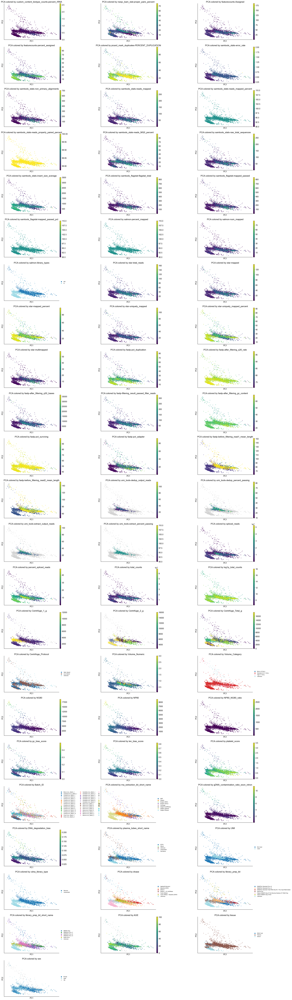

In [9]:
target_metrics = [
    'custom_content_biotype_counts-percent_rRNA',
    'rseqc_bam_stat-proper_pairs_percent', 'featurecounts-Assigned',
    'featurecounts-percent_assigned',
    'picard_mark_duplicates-PERCENT_DUPLICATION',
    'samtools_stats-error_rate', 'samtools_stats-non_primary_alignments',
    'samtools_stats-reads_mapped', 'samtools_stats-reads_mapped_percent',
    'samtools_stats-reads_properly_paired_percent',
    'samtools_stats-reads_MQ0_percent',
    'samtools_stats-raw_total_sequences',
    'samtools_stats-insert_size_average',
    'samtools_flagstat-flagstat_total', 'samtools_flagstat-mapped_passed',
    'samtools_flagstat-mapped_passed_pct', 'salmon-percent_mapped',
    'salmon-num_mapped', 'salmon-library_types', 'star-total_reads',
    'star-mapped', 'star-mapped_percent', 'star-uniquely_mapped',
    'star-uniquely_mapped_percent', 'star-multimapped',
    'fastp-pct_duplication', 'fastp-after_filtering_q30_rate',
    'fastp-after_filtering_q30_bases',
    'fastp-filtering_result_passed_filter_reads',
    'fastp-after_filtering_gc_content', 'fastp-pct_surviving',
    'fastp-pct_adapter', 'fastp-before_filtering_read1_mean_length',
    'fastp-before_filtering_read2_mean_length',
    'umi_tools-dedup_output_reads', 'umi_tools-dedup_percent_passing',
    'umi_tools-extract_output_reads', 'umi_tools-extract_percent_passing',
    'spliced_reads', 'percent_spliced_reads', 'total_counts',
    'log1p_total_counts', 'Centrifuge_1_g', 'Centrifuge_2_g',
    'Centrifuge_Total_g', 'Centrifuge_Protocol', 'Volume_Numeric',
    'Volume_Category', 'NG80', 'NP80', 'NP80_NG80_ratio', 'gc_bias_score',
    'len_bias_score', 'platelet_score', 'Batch_ID',
    'rna_extraction_kit_short_name','gDNA_contamination_ratio_exon_intron','DNA_degradation_bias',
    'plasma_tubes_short_name', 'UMI',
    'cdna_library_type', 'dnase',
    'library_prep_kit', 'library_prep_kit_short_name',
    'AGE', 'tissue', 'sex'
]

sc.pl.pca(
    adata,
    color=target_metrics,
    ncols=3,        
    cmap='viridis',  
    palette='tab20',
    title=[f"PCA colored by {m}" for m in target_metrics], 
    wspace=0.6, hspace=0.2,
    legend_fontsize='small',
    show=False
)
# plt.savefig("./Analysis_Results/overview/PCA_Metrics_Overview.png", dpi=200, bbox_inches='tight')

In [10]:
# adata.write_h5ad(DATA_DIR / 'Merged_Processed_AnnData_with_Batch_and_Biases.h5ad')

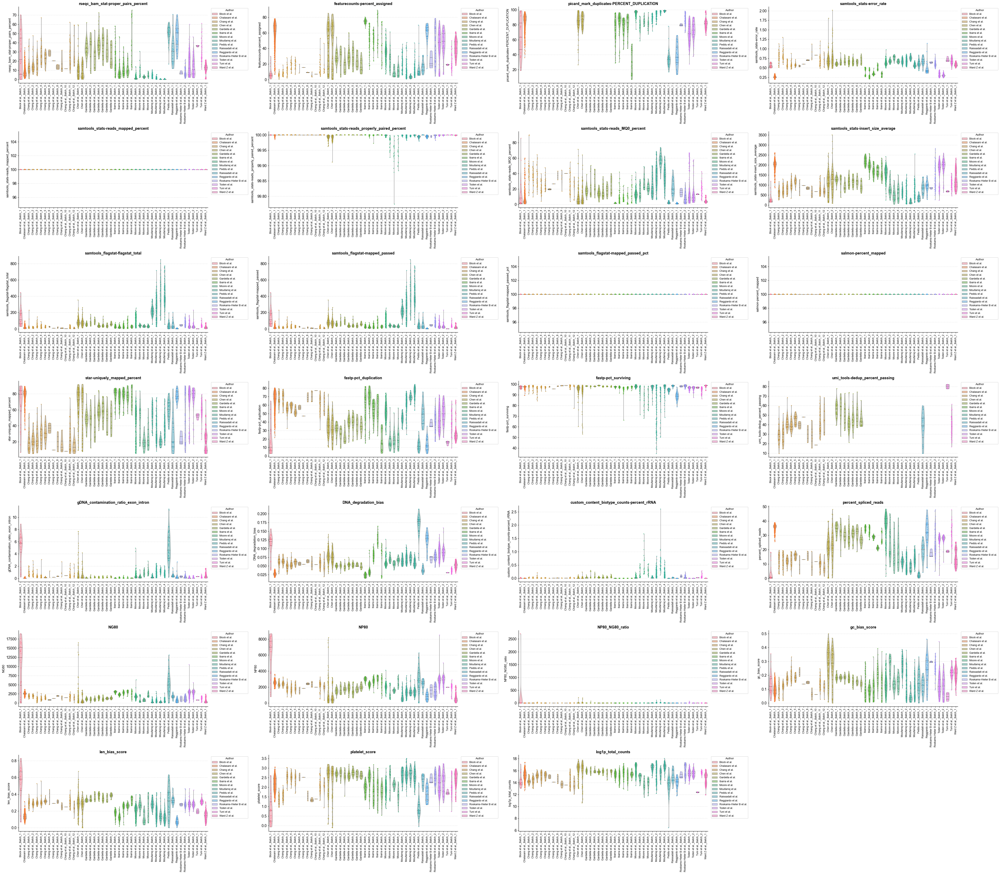

In [11]:
import math
import matplotlib.pyplot as plt
import seaborn as sns

target_metrics = [
    'rseqc_bam_stat-proper_pairs_percent',
    'featurecounts-percent_assigned', 'picard_mark_duplicates-PERCENT_DUPLICATION',
    'samtools_stats-error_rate', 'samtools_stats-reads_mapped_percent',
    'samtools_stats-reads_properly_paired_percent', 'samtools_stats-reads_MQ0_percent',
    'samtools_stats-insert_size_average', 'samtools_flagstat-flagstat_total',
    'samtools_flagstat-mapped_passed', 'samtools_flagstat-mapped_passed_pct',
    'salmon-percent_mapped', 'star-uniquely_mapped_percent', 
    'fastp-pct_duplication', 'fastp-pct_surviving', 'umi_tools-dedup_percent_passing',
    'gDNA_contamination_ratio_exon_intron','DNA_degradation_bias',
    'custom_content_biotype_counts-percent_rRNA', 
    'percent_spliced_reads', 'NG80', 'NP80', 'NP80_NG80_ratio', 
    'gc_bias_score', 'len_bias_score', 'platelet_score','log1p_total_counts', 
]

sorted_obs = adata.obs.sort_values(by=['Author', 'Batch_ID'])
batch_order = sorted_obs['Batch_ID'].unique()
n_metrics = len(target_metrics)
ncols = 4
nrows = math.ceil(n_metrics / ncols) 
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(48, 6 * nrows))
axes_flat = axes.flatten()

for i, metric in enumerate(target_metrics):
    ax = axes_flat[i]
    plot_data = sorted_obs.dropna(subset=[metric, 'Batch_ID', 'Author'])
    
    sns.violinplot(
        data=plot_data, 
        x='Batch_ID', 
        y=metric, 
        hue='Author',       
        order=batch_order, 
        dodge=False,        
        inner='quartile',  
        linewidth=1,
        alpha=0.5,
        cut=0,             
        ax=ax
    )
    
    sns.stripplot(
        data=plot_data, 
        x='Batch_ID', 
        y=metric, 
        hue='Author', 
        order=batch_order,
        dodge=False,
        size=3,             
        alpha=0.7,          
        jitter=True,        
        ax=ax,
        legend=False        
    )
    
    ax.set_title(f"{metric}", fontsize=13, fontweight='bold')
    ax.set_ylabel(metric, fontsize=11)
    ax.set_xlabel("") 
    ax.tick_params(axis='x', rotation=90, labelsize=9) 
    
    handles, labels = ax.get_legend_handles_labels()
    unique_handles = dict(zip(labels, handles))
    ax.legend(
        unique_handles.values(), unique_handles.keys(), 
        bbox_to_anchor=(1.01, 1), loc='upper left', title='Author', fontsize=9
    )
    ax.grid(axis='y', linestyle='--', alpha=0.3)

for j in range(n_metrics, len(axes_flat)):
    fig.delaxes(axes_flat[j])

plt.tight_layout()
# plt.savefig("./Analysis_Results/overview/Batch_Metric_Overview.png", bbox_inches='tight')